**Анализ заведений общественного питания Москвы**
_____

**Описание исследования.**
    Необходимо проанализировать рынок заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. 
_____
**Цель исследования.**
    
Провести исследование рынка заведений общепита Москвы для определения его особенностей и закономерностей. Дать рекомендации по открытию нового заведения.
   
_____
**Задачи исследования.**

Необходимо провести предобработку данных, исследовательский анализ данных и визуализировать результаты.
_____
**Исходные данные.**
    
     Описание данных
     Путь к файлу: /datasets/moscow_places.csv.
    name — название заведения;
    address — адрес заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    «Средний счёт: 1000–1500 ₽»;
    «Цена чашки капучино: 130–220 ₽»;
    «Цена бокала пива: 400–600 ₽».
    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
    district — административный район, в котором находится заведение, например Центральный административный округ;
    seats — количество посадочных мест.

______

Данное исследование разделим на несколько частей.

***Часть 1. Загрузка данных:***
* [1. Загрузка данные о заведениях общественного питания Москвы](#1-bullet)

***Часть 2.  Предобработка данных:***
* [1. Проверка дубликатов в данных.](#2-bullet)
* [2. Проверка пропусков и типов данных.](#3-bullet)
* [3. Создание столбца с названиями улиц.](#4-bullet)
* [4. Создание столбца с режимом работы.](#5-bullet)

***Часть 3. Анализ данных:***
* [1. Категории заведений.](#6-bullet)
* [2. Количество посадочных мест по категориям.](#7-bullet)
* [3. Соотношение сетевых и несетевых заведений.](#8-bullet)
* [4. Категории сетевых заведений.](#9-bullet)
* [5. Топ-15 популярных сетей.](#10-bullet)
* [6. Распределение по районам.](#11-bullet)
* [7. Визуализация распределения рейтингов по катиегориям заведений.](#12-bullet)
* [8. Хороплет со средним рейтингом.](#13-bullet)
* [9. Карта с заведениями.](#14-bullet)
* [10. Топ-15 улиц по количеству заведений.](#15-bullet)
* [11. Улицы с одним объектом.](#16-bullet)
* [12. Распределение среднего чека заведений по районам.](#17-bullet)
* [13. Исследование взаимосвязей.](#18-bullet)
* [14. Общий вывод.](#19-bullet)

***Часть 4. Анализ кофеен:***
* [1. Анализ количество кофеен, распределение по районам.](#20-bullet)
* [2. Анализ режима работы кофеен.](#21-bullet)
* [3. Анализ рейтингов кофеен, распределение по районам.](#22-bullet)
* [4. Анализ стоимости чашки капучино.](#23-bullet)

***[Часть 5. Презентация.](#24-bullet)***

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from plotly import graph_objects as go 
import plotly.express as px
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

#### Загрузка данных

<a id = '1-bullet'></a>
##### Загрузка данные о заведениях общественного питания Москвы.
Выведем информацию о датафрейме и выведем первые строки набора данных.

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/moscow_places.csv', sep='\t')

data.info() #выведем информацию о датасете

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [3]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4990,Халял,кафе,"Москва, Большая Татарская улица, 28, стр. 1",Центральный административный округ,"ежедневно, 12:00–20:00",55.739094,37.632627,4.5,средние,Средний счёт:250–350 ₽,300.0,NaN,0,NaN
6972,Di Villaggio,пиццерия,"Москва, Профсоюзная улица, 45",Юго-Западный административный округ,"ежедневно, 10:00–22:40",55.666670,37.552329,4.3,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN
6824,Бургер Кинг,ресторан,"Москва, Профсоюзная улица, 126, корп. 2",Юго-Западный административный округ,"ежедневно, 05:00–03:00",55.631100,37.517500,4.2,средние,Средний счёт:270–300 ₽,285.0,NaN,1,170.0
1441,Coffeeizm,кофейня,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,пн-пт 09:00–18:00,55.815522,37.513148,4.3,NaN,Средний счёт:300–350 ₽,325.0,NaN,0,180.0
6107,Ngon,быстрое питание,"Москва, улица Вавилова, 64/1с1",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.683920,37.550797,4.5,средние,Средний счёт:300–700 ₽,500.0,NaN,1,NaN
4805,Чайхона,кафе,"Москва, улица Фридриха Энгельса, 20с1",Центральный административный округ,"ежедневно, круглосуточно",55.772513,37.683210,4.1,NaN,NaN,NaN,NaN,1,NaN
6880,Office-club,кафе,"Москва, Научный проезд, 19",Юго-Западный административный округ,пн-пт 08:00–20:00,55.653190,37.554575,4.1,средние,Средний счёт:350–800 ₽,575.0,NaN,0,200.0
18,Час-Пик,столовая,"Москва, Коровинское шоссе, 30А",Северный административный округ,"ежедневно, 09:00–21:00",55.884651,37.517482,4.3,средние,Средний счёт:200–300 ₽,250.0,NaN,0,25.0
6615,Швили,ресторан,"Москва, проспект Вернадского, 41",Западный административный округ,"ежедневно, 12:00–23:00",55.674590,37.503468,4.4,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,1,NaN
1890,Диван,кафе,"Москва, улица Сущёвский Вал, 5с1",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.794932,37.593178,4.8,NaN,NaN,NaN,NaN,1,NaN


В датасете данные о 8406 заведений, 14 столбцов.

#### Предобработка данных

<a id = '2-bullet'></a>
##### Проверка дубликатов в данных.

In [4]:
#проверка явных дубликатов
data.duplicated().sum() 

0

In [5]:
# попробуем проверить неявные дубликаты по названию и адресу
data.duplicated(['name', 'address']).sum()

0

In [6]:
# переведем значенияв столбцах с именем иадресов м нижний регистр
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.duplicated(['name', 'address']).sum() #проверим неявные дубликаты

4

In [7]:
data[data.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [8]:
# тк дубликатов всего 4 удалим их
data = data.drop(data[data.duplicated(['name', 'address'])].index).reset_index()

In [9]:
data[data.duplicated(['name', 'address'])]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


<a id = '3-bullet'></a>
##### Проверка пропусков данных.

In [10]:
data.isna().sum() #найдем нулевые значения по всем столбцам

index                   0
name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Большое количество пропусков данных в столбцах с категорией цены и средним чеком, удалить такое количество данных мы не можем, как и заполнить их. Предпологаем, что отсутсвие данных в столбцах не повлияет на исследование.

<a id = '4-bullet'></a>
##### Создание столбца с названиями улиц.

In [11]:
#заполним столбец с названием улицы
for i in range(0, data.shape[0]):
    d = data.loc[i, "address"].split(', ')
    data.loc[i, "street"] = d[1]

In [12]:
#Код ревьюера
data.query('street == "проспект мира"')

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
717,718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
785,786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
791,792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира
799,800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,проспект мира
908,909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2565,2568,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,0,273.0,проспект мира
2568,2571,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0,проспект мира
2569,2572,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,0,200.0,проспект мира
4778,4782,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,проспект мира


<a id = '5-bullet'></a>
##### Создание столбца с режимом работы.

In [13]:
#создадим функцию для заполнения столбца с режимом работы
def categorize(hours):
    if hours == 'ежедневно, круглосуточно':
        return True
    else: 
        return False
    
data['is_24_7'] = data['hours'].apply(categorize)
# выведем для примера несколько строк датафрейма
data[data['is_24_7'] == True]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,10,great room bar,"бар,паб","москва, левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,левобережная улица,True
17,17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
19,19,пекарня,булочная,"москва, ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,ижорский проезд,True
24,24,drive café,кафе,"москва, улица дыбенко, 9ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,True
49,49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,ижорская улица,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8390,8394,намангале,кафе,"москва, ферганская улица, вл17-21",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.705332,37.819244,4.3,NaN,NaN,NaN,NaN,0,NaN,ферганская улица,True
8395,8399,"пекарня, кафе-гриль",булочная,"москва, болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0,болотниковская улица,True
8399,8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8400,8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


Провели предобработку данных, проверили пропуски, дубликаты в датафрейме, создали необходимые столбцы для дальнейшего анализа.

#### Анализ данных

In [14]:
sns.set_palette("Set2")

<a id = '6-bullet'></a>
##### Категории заведений.

In [15]:
#выведем уникальные названия категорий заведений
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [16]:
#составим сводную таблицу с подсчетом количества заведений по категориям
data_cat = data.pivot_table(index='category', values='name', aggfunc='count').sort_values(
       by = 'name', ascending = False).reset_index()
display(data_cat)
# выведем круговую диаграмму по категориям
fig = go.Figure(data=[go.Pie(labels=data_cat['category'], values=data_cat['name'])])
fig.update_layout(title="Распределение по категориям", height=400,
                  width=500)
fig.show() 

,category,name
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Больше всего в Москве ресторанов и кафе - 28 и 24 % соответсвенно. Кофеен почти 17%. На остальные категории приходится менее 10% на каждую.

 Построим столбчатую диаграмму распределения заведений по категориям

Text(0.5, 1.0, 'Количество заведений по категориям')

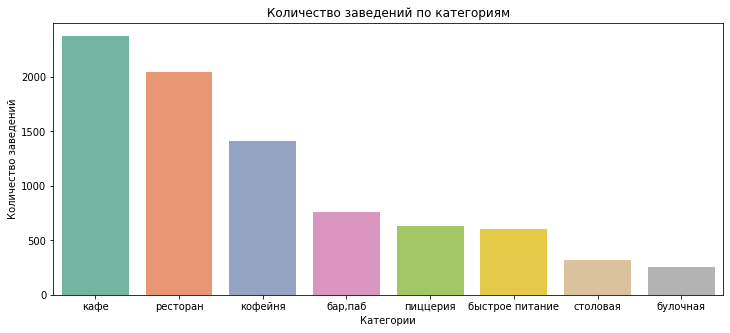

In [17]:
#  построим столбчатую диаграмму
plt.figure(figsize=(12, 5))
sns.barplot(x="category", y="name", data=data_cat) 
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.title('Количество заведений по категориям')

<a id = '7-bullet'></a>
##### Количество посадочных мест по категориям.

In [18]:
#составим сводную таблицу с подсчетом посадочныйх мест для каждой категории заведений
data_seat = data.pivot_table(index='category', values='seats', aggfunc={'sum', 'mean', 'median'}).sort_values(
       by = 'median', ascending = False).reset_index()
data_seat

,category,mean,median,sum
0,ресторан,121.892041,86.0,154681.0
1,"бар,паб",124.477516,82.0,58131.0
2,кофейня,111.199734,80.0,83511.0
3,столовая,99.750000,75.5,16359.0
4,быстрое питание,98.891117,65.0,34513.0
5,кафе,97.365653,60.0,118494.0
6,пиццерия,94.496487,55.0,40350.0
7,булочная,89.385135,50.0,13229.0


Text(0.5, 1.0, 'Количество посадочных мест по категориям')

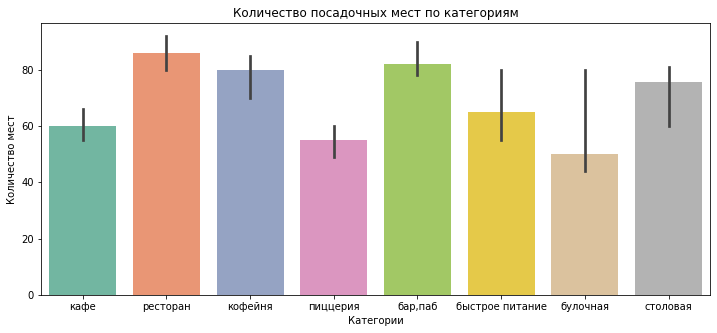

In [19]:
# диаграмму с медианой посадочных мест по категориям заведений
plt.figure(figsize=(12, 5))
sns.barplot(x="category", y="seats", data=data, estimator=np.median) 
plt.xlabel('Категории')
plt.ylabel('Количество мест')
plt.title('Количество посадочных мест по категориям')

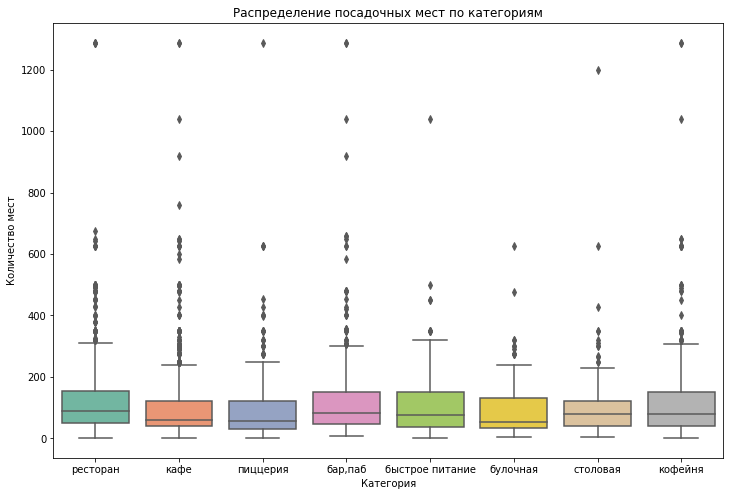

In [20]:
# диаграмму посадочных мест по категориям заведений
plt.figure(figsize=(12,8))
sns.boxplot(data=data.query('seats > 0'), x='category', y='seats')
plt.xlabel('Категория')
plt.ylabel('Количество мест')
plt.title('Распределение посадочных мест по категориям')
plt.show()

Медианные значения по категориям заведений в большинстве находятся в диапазоне 40 до 80 посадочных мест, самые большие средние значения у ресторанов, баров и кофеен, минимальное у булочных и пицерий, скорее всего это связано с тем, что в этих форматах чаще всего берут еду на вынос.

<a id = '8-bullet'></a>
##### Соотношение сетевых и несетевых заведений.

Text(0.5, 1.0, 'Распределение заведений')

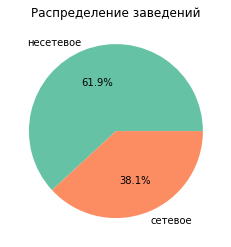

In [21]:
def categorize(chain):
    if chain == 1:
        return 'сетевое'
    else: 
        return 'несетевое'
data['chain_cat'] = data['chain'].apply(categorize)
data_chain = data.pivot_table(index='chain_cat', values='name', aggfunc='count').reset_index()
plt.figure(figsize=(4,4))
plt.pie(data_chain['name'], labels=data_chain['chain_cat'], autopct='%1.1f%%')
plt.title('Распределение заведений')

Около 38% из всех заведений являются сетевыми.

<a id = '9-bullet'></a>
##### Категории сетевых заведений.

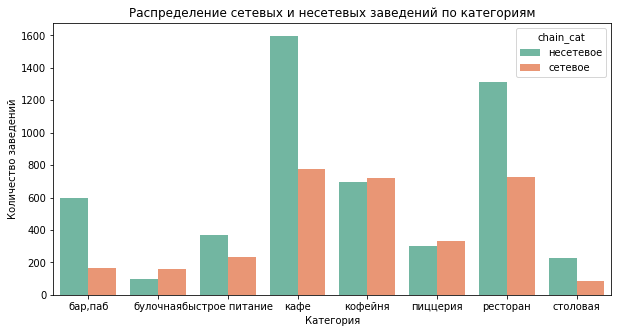

In [22]:
data_chain = data.groupby(['category','chain_cat'], as_index=False).agg({'name': 'count'})
plt.figure(figsize=(10, 5))
sns.barplot(x="category", y="name", hue="chain_cat", data=data_chain);
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

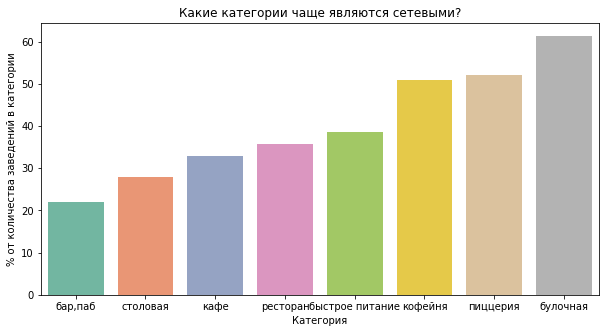

In [23]:
#рассчитаем сколько процентов сетевые заведения занимают в каждой категории
data_chain_1 = data_chain.query('chain_cat == "сетевое"').merge(data_cat, on='category', how='left')
data_chain_1['pr'] = round(data_chain_1['name_x']*100/data_chain_1['name_y'], 2)
data_chain_1= data_chain_1.sort_values(by='pr')
# построим столбчатую диаграмму
plt.figure(figsize=(10, 5))
sns.barplot(x="category", y="pr", data=data_chain_1);
plt.title('Какие категории чаще являются сетевыми?')
plt.xlabel('Категория')
plt.ylabel('% от количества заведений в категории')
plt.show()

Булочные, кофейни и пиццерии чаще всего являются сетевыми заведениями. Для самых больших категорий - кафе и рестораны количество сетевых заведений в два раза меньше чем несетевых.

<a id = '10-bullet'></a>
##### Топ-15 популярных сетей.

In [24]:
# выберем топ-15 популярных сетей

top_chain = data.query('chain_cat == "сетевое"').pivot_table(index='name', values='address', aggfunc='count').sort_values(
    by = 'address', ascending = False).head(15)
top_chain


,address
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,69
cofix,65
prime,50
хинкальная,44
кофепорт,42


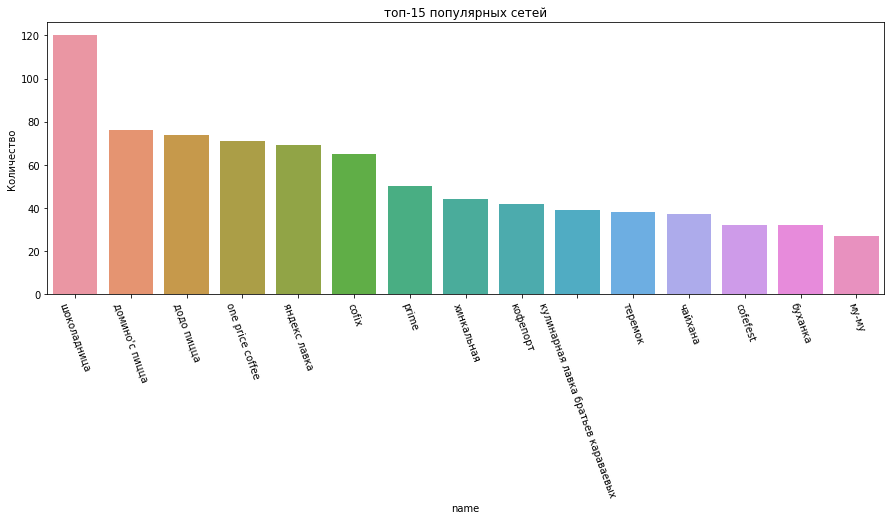

In [25]:
plt.figure(figsize=(15, 5))
sns.barplot(x=top_chain.index, y="address", data=top_chain)
plt.title('топ-15 популярных сетей')
plt.ylabel('Количество')
plt.xticks(rotation=290)
plt.show()

In [26]:
#составим таблицу с распределением в топ-15 сетей по категориям
d = data.query('name in @top_chain.index').groupby(
    ['name', 'category'], as_index=False)['address'].count().sort_values(by='address', ascending=True)
# создадим столбчатую диаграмму с накоплением
fig = px.bar(d, 
             x='name', 
             y='address', 
             color='category',
             text='address' 
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
    title='Распределение топ-15 сетей по категориям',
                   xaxis_title='Сеть',
                   yaxis_title='Количество заведений',
                   width=1000, 
                   height=800)
fig.show() 

Наибольшее количество заведений в таких сетях как Шоколадница, Доминос пицца, Додо пицца. Это достаточно известные заведения. А вот при разбивке по категориям внутри сетей не все так однозначно - есть сети в которых заведения помещены в разные категории. В сети Му-МУ например присутствуют заведения из 7 категорий.

<a id = '11-bullet'></a>
##### Распределение по районам.

In [27]:
# выведем уникальные названия административных округов
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [28]:
# сгруппируем таблицу по округу и категориям 
d = data.groupby(['district', 'category'], as_index=False)['address'].count().sort_values(by='address', ascending=True)
# создадим столбчатую диаграмму с накоплением
fig = px.bar(d, 
             x='district', 
             y='address', 
             color='category',
             text='address' 
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
    title='Количество заведений по округам',
                   xaxis_title='Округ',
                   yaxis_title='Количество заведений',
                   width=800, 
                   height=600)
fig.show() 

В датасете присутствуют все 9 округов Москвы, в каждом округе присутсвуют все категории заведений. Больше всего заведений в ЦАО, так же в этом округе больше всего ресторанов, в остальных округах большинство заведений это кафе.

<a id = '12-bullet'></a>
##### Визуализация распределения рейтингов по катиегориям заведений.

In [29]:
data_rating = data.groupby('category', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False)
data_rating['rating'] = round(data_rating['rating'], 2)
data_rating 

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


Text(0.5, 1.0, 'Средний рейтинг заведений по категориям')

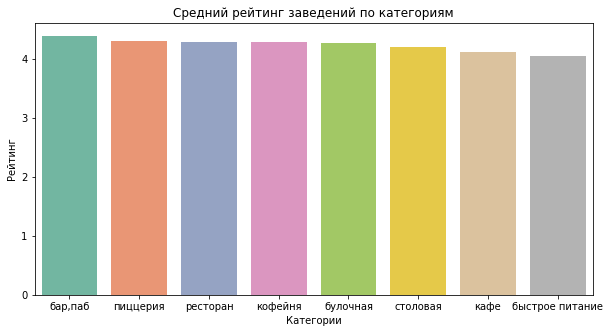

In [30]:
plt.figure(figsize=(10, 5))
sns.barplot(x="category", y="rating", data=data_rating) 
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.title('Средний рейтинг заведений по категориям')

Средние рейтинги по категориям не сильно различаются - от 4,05 до 4,39.

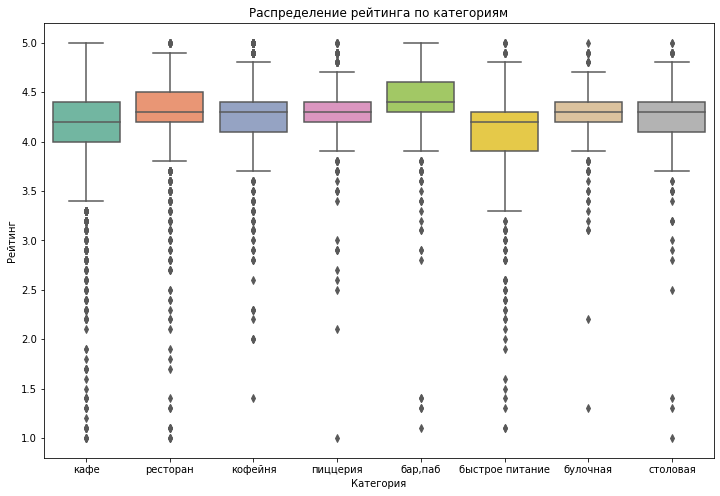

In [31]:
# диаграмма посадочных мест по рейтингу
plt.figure(figsize=(12,8))
sns.boxplot(data=data, x='category', y='rating')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.title('Распределение рейтинга по категориям')
plt.show()

Средний рейтинг колеблется от 4 до 4,5 , также  есть выбросы с мин рейтином 1-3 балла. Больше всего таких рейтингов у кафе, ресторанов и заведений быстрого питания.

<a id = '13-bullet'></a>
##### Хороплет со средним рейтингом.

In [32]:
#создадим таблицу со средним рейтингом по округам
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_df['rating'] = round(rating_df['rating'], 2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [33]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг в ЦАО, самый низкий в ЮВАО.

<a id = '14-bullet'></a>
##### Карта с заведениями..

In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Больше всего заведений в ЦАО

<a id = '15-bullet'></a>
##### Топ-15 улиц по количеству заведений.

In [35]:
# выберем топ-15 улиц по количеству заведений

top_street = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(
    by = 'name', ascending = False).head(15)
top_street


,name
street,
проспект мира,183
профсоюзная улица,122
проспект вернадского,108
ленинский проспект,107
ленинградский проспект,95
дмитровское шоссе,88
каширское шоссе,77
варшавское шоссе,76
ленинградское шоссе,70


In [36]:
# сделаем срез данных по 15 популярным улицам в разрезе категорий 
d = data.query('street in @top_street.index').groupby(
    ['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=True)
# составим столбчатую диаграмму с накоплением 
fig = px.bar(d, 
             x='street', 
             y='name', 
             color='category',
             text='name' 
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
    title='Распределение топ-15 улиц',
                   xaxis_title='Улица',
                   yaxis_title='Количество заведений',
                   width=1000, 
                   height=800)
fig.show() 

Больше всего заведений на проспекте Мира, Профсоюзной улице и проспекте Вернадского, что логично это достаточно крупные улицы с метро.

<a id = '16-bullet'></a>
##### Улицы с одним объектом.

In [37]:
# список улиц с одним заведением
street_list = data['street'].value_counts().loc[lambda x : x == 1].index
d = data.query('street in @street_list')
display('Количество улиц с одним заведением', len(street_list))
display(street_list)
# составим сводную таблицу с разбивкой по категориям
d_cat = d.pivot_table(index='category', values='name', aggfunc='count').sort_values(
       by = 'name', ascending = False).reset_index()
# построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=d_cat['category'], values=d_cat['name'])])
fig.update_layout(title="Распределение по категориям", height=400,
                  width=500)
fig.show() 

'Количество улиц с одним заведением'

457

Index(['малый николопесковский переулок', 'чермянский проезд',
       'черёмушкинский проезд', 'посланников переулок', 'улица розанова',
       'скотопрогонная улица', 'улица гашека', 'малый кисловский переулок',
       'боровское шоссе', 'большая пионерская улица',
       ...
       'будайский проезд', 'улица острякова', 'вагоноремонтная улица',
       'маленковская улица', 'весёлая улица', 'большой волоколамский проезд',
       'проезд одоевского', '3-й проезд подбельского', 'котляковская улица',
       'стрелецкая улица'],
      dtype='object', length=457)

Всего 458 таких улиц, предполагаю что они короткие, поэтому на них мало заведений, в основном это кафе.

<a id = '17-bullet'></a>
##### Распределение среднего чека заведений по районам.

In [38]:
# найдем медиану средного чека по округам 
bill_df = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(
    by='middle_avg_bill', ascending=False)

bill_df

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [39]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самый дорогой средний чек в ЦАО и ЗАО.

<a id = '18-bullet'></a>
##### Исследование взаимосвязей.


In [40]:
#круглосуточные заведения в разбивке по категориям 
d = data.groupby(
    ['is_24_7', 'category'], as_index=False)['address'].count().sort_values(by='address', ascending=True)
fig = px.bar(d, 
             x='category', 
             y='address', 
             color='is_24_7',
             text='address' 
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
    title='Распределение заведений по режиму работы',
                   xaxis_title='Категория',
                   yaxis_title='Количество заведений',
                   width=800, 
                   height=500)
fig.show() 

In [41]:
#круглосуточные заведения в разбивке по категориям 
d = data.groupby(
    ['is_24_7', 'district'], as_index=False)['address'].count().sort_values(by='address', ascending=True)
fig = px.bar(d, 
             x='district', 
             y='address', 
             color='is_24_7',
             text='address' 
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
    title='Распределение по режиму работы',
                   xaxis_title='Район',
                   yaxis_title='Количество заведений',
                   width=800, 
                   height=800)
fig.show() 

Больше всего круглосуточных заведений в ЦАО, в остальных районах больше всего круглосуточных заведений категории кафе, заведениях быстрого питания и рестораны.

<a id = '19-bullet'></a>
##### Вывод.

    Больше всего в Москве ресторанов и кафе - 28 и 24 % соответсвенно. Кофеен почти 17%. На остальные категории приходится менее 10% на каждую.
    Медианные значения посадочных мест по категориям заведений в большинстве находятся в диапазоне 40 до 80 посадочных мест, самые большие средние значения у ресторанов, баров и кофеен, минимальное у булочных и пицерий, скорее всего это связано с тем, что в этих форматах чаще всего берут еду на вынос. 
    Около 38% из всех заведений являются сетевыми.Булочные, кофейни и пиццерии чаще всего являются сетевыми заведениями. Для самых больших категорий - кафе и рестораны количество сетевых заведений в два раза меньше чем несетевых. Наиболее крупные сети это Шоколадница, Доминос пицца, Додо пицца. Это достаточно известные заведения. А вот при разбивке по категориям внутри сетей не все так однозначно - есть сети в которых заведения помещены в разные категории.
    В датасете присутствуют все 9 округов Москвы, в каждом округе присутсвуют все категории заведений. Больше всего заведений в ЦАО, так же в этом округе больше всего ресторанов, в остальных округах большинство заведений это кафе, что логично, в центре заведения ориентированы больше на туристов, в остальных округах в основном на жителей города.
    Средние рейтинги по категориям не сильно различаются - от 4,05 до 4,38. Самый высокий усредненный рейтинг в ЦАО, самый низкий в ЮВАО.
    Больше всего заведений на проспекте Мира, ул. Пролфсоюзной и на проспекте Вернадского, в основном это кафе, рестораны и кофейни. Всего 458 улиц, на которых всего одно заведение, предполагаю что они короткие, поэтому на них мало заведений, в основном это кафе.
    Самый дорогой средний чек в ЦАО и ЗАО, самый маленький средний чек в ЮАО, ЮВАО и СВАО.
    Больше всего круглосуточных заведений в ЦАО, т.к. там больше всего заведений. Больше всего круглосуточных заведений категории кафе, заведениях быстрого питания и рестораны.

#### Анализ кофеен

<a id = '20-bullet'></a>
##### Анализ количество кофеен, распределение по районам.

In [42]:
data_coffee = data.query('category == "кофейня"')
display('Количество кофеен в датасете', data_coffee.shape[0])
# составим сводную таблицу с разбивкой по категориям
data_coffee_dis = data_coffee.pivot_table(index='district', values='name', aggfunc='count').sort_values(
       by = 'name', ascending = False).reset_index()
# построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=data_coffee_dis['district'], values=d_cat['name'])])
fig.update_layout(title="Распределение по округам", height=600,
                  width=600)
fig.show() 

'Количество кофеен в датасете'

1413

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

Text(0.5, 1.0, 'Распределение заведений')

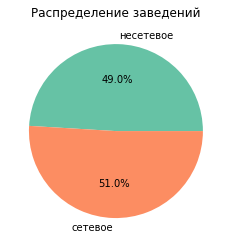

In [44]:
data_coffee_chain = data_coffee.pivot_table(index='chain_cat', values='name', aggfunc='count').reset_index()
plt.figure(figsize=(4,4))
plt.pie(data_coffee_chain['name'], labels=data_coffee_chain['chain_cat'], autopct='%1.1f%%')
plt.title('Распределение заведений')

Больше всего кофеен в центральном округе, на севере и западе Москвы, распределение между сетевыми и несетевыми кофейнями примерно одинаковое.

<a id = '21-bullet'></a>
##### Анализ режима работы кофеен.

Text(0.5, 1.0, 'Распределение заведений по режиму работы')

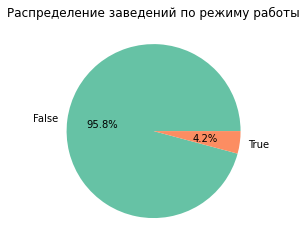

In [45]:
data_coffee_24 = data_coffee.pivot_table(index='is_24_7', values='name', aggfunc='count').reset_index()
plt.figure(figsize=(4,4))
plt.pie(data_coffee_24['name'], labels=data_coffee_24['is_24_7'], autopct='%1.1f%%')
plt.title('Распределение заведений по режиму работы')

Всего 4% кофеен круглосуточные.

<a id = '22-bullet'></a>
##### Анализ рейтингов кофеен, распределение по районам.

In [46]:
#создадим таблицу со средним рейтингом по округам
rating_cof = data_coffee.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=True)
rating_cof['rating'] = round(rating_df['rating'], 2)
rating_cof

,district,rating
1,Западный административный округ,4.18
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38


In [47]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cof,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Сильного различия в среднем рейтинге нет, варьируется от 4,1 до 4,38. Самый высокий рейтинг в ЦАО.

<a id = '23-bullet'></a>
##### Анализ стоимости чашки капучино.

In [48]:
# найдем медиану стоимости чашки каппучино по округам 
coffee_cup = data_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(
    by='middle_coffee_cup', ascending=True)
coffee_cup

,district,middle_coffee_cup
0,Восточный административный округ,135.0
6,Юго-Восточный административный округ,147.5
8,Южный административный округ,150.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
1,Западный административный округ,189.0
5,Центральный административный округ,190.0
7,Юго-Западный административный округ,198.0


In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по районам',
).add_to(m)

# выводим карту
m

Средняя цена за чашку каппучино по Москве варьируется от 135 до 190 руб., самое дорогой кофе в ЦАО, ЗАО и ЮЗАО.

    Вывод: 
    Всего в Москве 1413 кофеен, этооколо 17% от общего числа заведений общепита.
    Больше всего кофеен в центральном округе, на севере и западе Москвы, распределение между сетевыми и несетевыми кофейнями примерно поровну. Всего 4% кофеен круглосуточные.
    Сильного различия в среднем рейтинге кофеен нет, варьируется от 4,1 до 4,38. Самый высокий рейтинг в ЦАО.Средняя цена за чашку каппучино по Москве варьируется от 135 до 190 руб., самое дорогой кофе так же в ЦАО, ЗАО и ЮЗАО.
    Для открытия новых кофеен рекомендуем рассмотреть ЮАО, ЮЗАО, ЮВАО, т.к. там наименьшее количество кофеен, так же там довольно активно строятся новые станции метрополитена (например Троицкая линия) и новые ЖК, на сегодняшгий день достаточно популяная история по дороге на работу взять у метро чашку кофе и какой-то завтрак на бегу. Т.е. можно рассмотреть вариант кофе с собой с едой на вынос, которые открываются ранним утром. 

<a id = '24-bullet'></a>
#### Презентация

https://disk.yandex.ru/i/qwAznRuFzcq-iQ